In [1]:
%cd ../

/home/eli/AnacondaProjects/HTFATorch


In [2]:
import logging
import numpy as np
import re

import htfa_torch.htfa as HTFA
import htfa_torch.niidb as niidb
import htfa_torch.utils as utils

/home/eli/anaconda3/envs/HTFATorch/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [3]:
%matplotlib inline

In [4]:
logging.basicConfig(format='%(asctime)s %(message)s', datefmt='%m/%d/%Y %H:%M:%S',
                    level=logging.INFO)

In [5]:
lepping_db = niidb.FMriActivationsDb('data/sound_depression.db', mask='/home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz')

In [6]:
htfa = HTFA.HierarchicalTopographicFactorAnalysis([b for b in lepping_db.all() if b.task not in ['response', 'tones']], mask='/home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz', num_factors=100)

01/31/2020 18:17:37 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run3_music_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/31/2020 18:17:39 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run2_music_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/31/2020 18:17:40 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run4_nonmusic_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/31/2020 18:17:42 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run5_nonmusic_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depr

In [7]:
htfa.num_parameters()

1731200

In [8]:
htfa.load_state('data/lepping_2017_noresponse_k100_n1500_01312020_170024')

In [9]:
def subject_labeler(block):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(block.subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        condition = 'Major Depressive'
    elif condition == 'control':
        condition = 'Control'
    return '%s Participant %d' % (condition, int(sub_num))

In [10]:
def task_labeler(block):
    if block.task == 'negative_music':
        task = 'Negative music'
    elif block.task == 'positive_music':
        task = 'Positive music'
    elif block.task == 'negative_nonmusic':
        task = 'Negative sounds'
    elif block.task == 'positive_nonmusic':
        task = 'Positive sounds'
    else:
        task = block.task.capitalize()
    return task

In [11]:
def lepping_2017_labeler(block):
    task = task_labeler(block)
    return task + ' stimulus'

In [12]:
validation_filter = lepping_db.inference_filter(training=False)
validation_blocks = [b for (b, block) in enumerate(htfa._blocks) if validation_filter(block)]

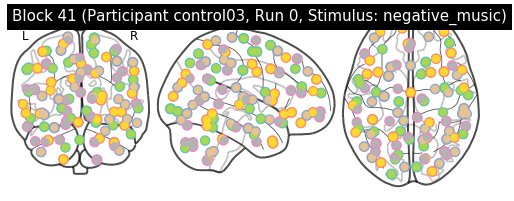

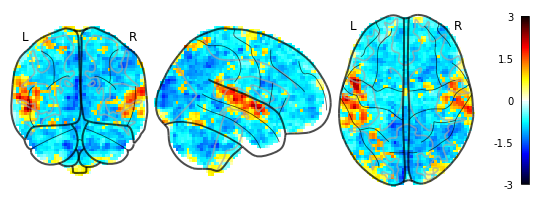

01/31/2020 18:22:48 Reconstruction Error (Frobenius Norm): 8.47876770e+02 out of 8.44604187e+02


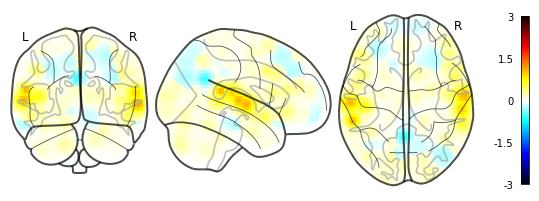

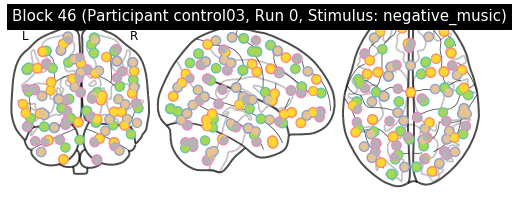

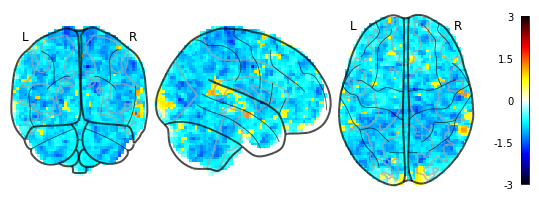

01/31/2020 18:22:52 Reconstruction Error (Frobenius Norm): 1.04109839e+03 out of 1.03223840e+03


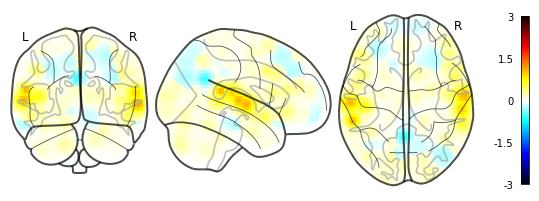

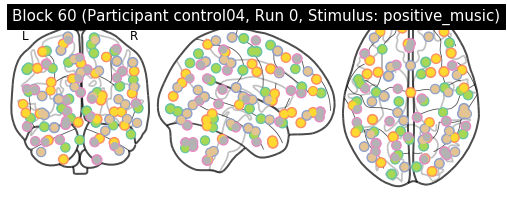

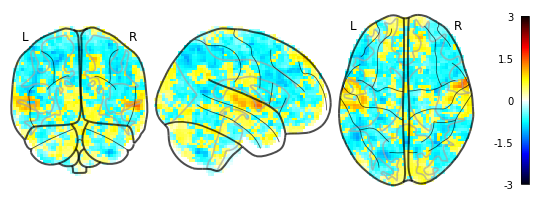

01/31/2020 18:22:56 Reconstruction Error (Frobenius Norm): 8.67265869e+02 out of 8.63454956e+02


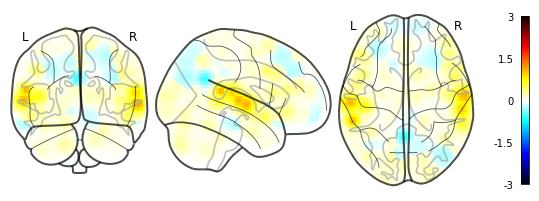

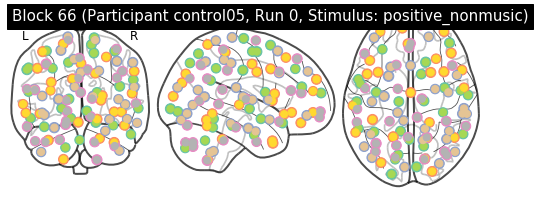

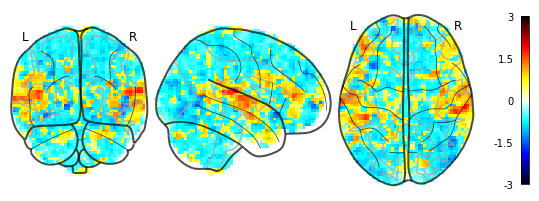

01/31/2020 18:22:59 Reconstruction Error (Frobenius Norm): 8.93227661e+02 out of 8.93795532e+02


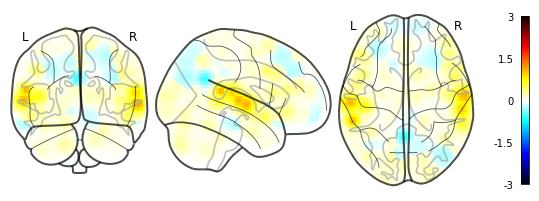

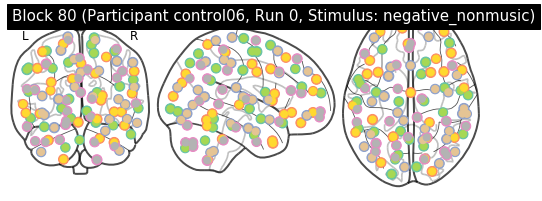

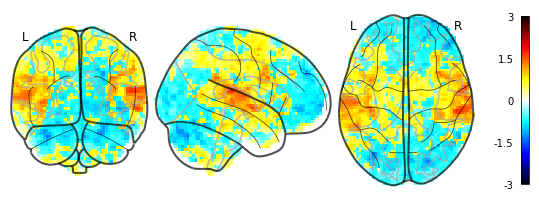

01/31/2020 18:23:03 Reconstruction Error (Frobenius Norm): 8.77284973e+02 out of 8.80790527e+02


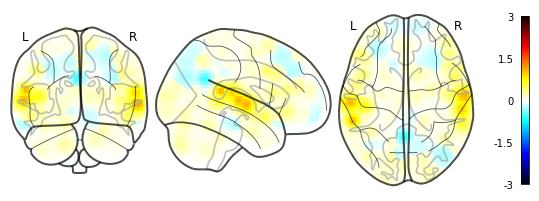

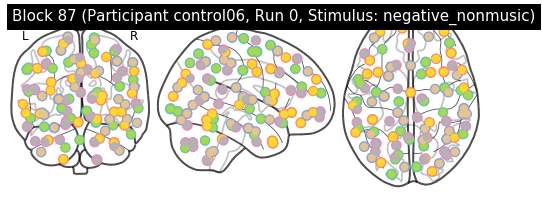

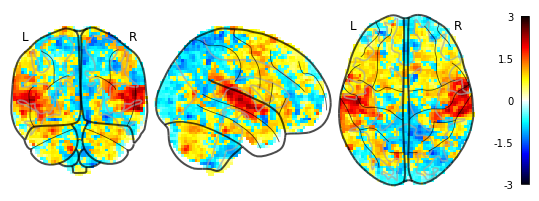

01/31/2020 18:23:07 Reconstruction Error (Frobenius Norm): 1.03512512e+03 out of 1.04409570e+03


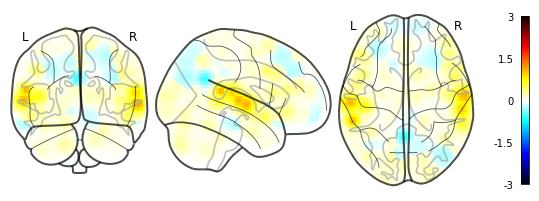

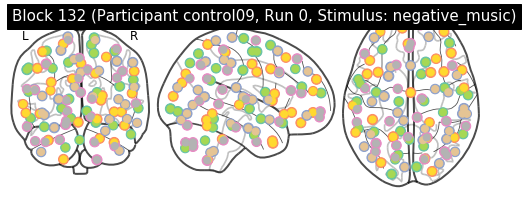

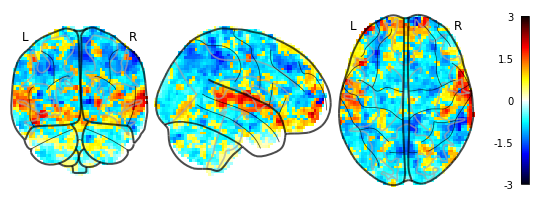

01/31/2020 18:23:11 Reconstruction Error (Frobenius Norm): 8.59353455e+02 out of 8.59400330e+02


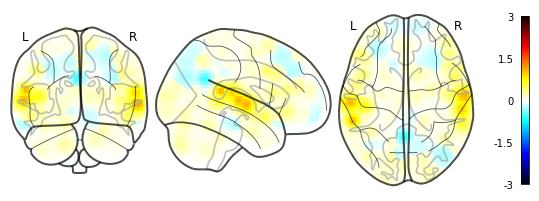

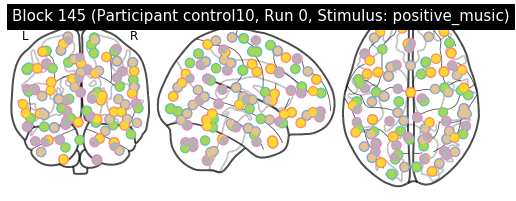

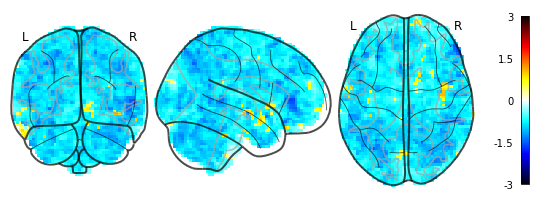

01/31/2020 18:23:15 Reconstruction Error (Frobenius Norm): 9.17276428e+02 out of 9.03192444e+02


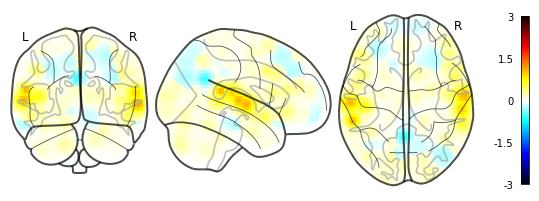

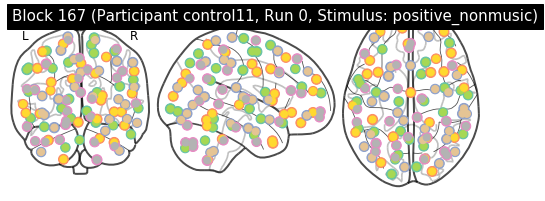

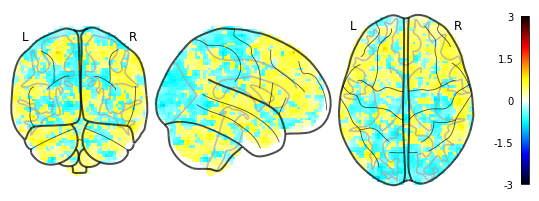

01/31/2020 18:23:18 Reconstruction Error (Frobenius Norm): 8.36230896e+02 out of 8.34299194e+02


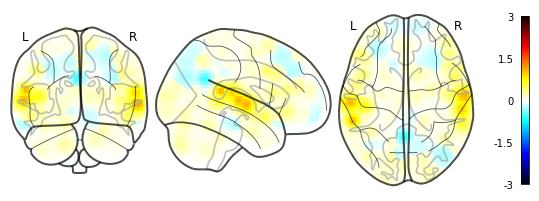

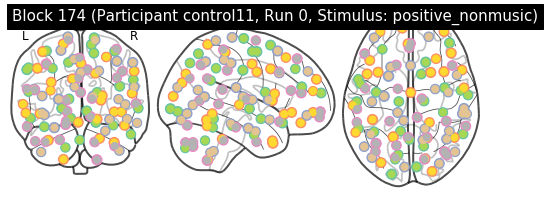

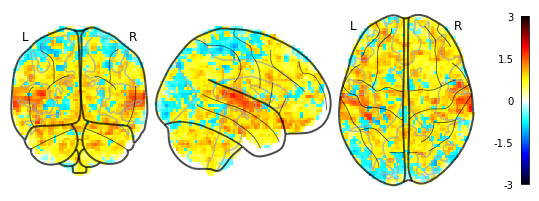

01/31/2020 18:23:22 Reconstruction Error (Frobenius Norm): 9.05789856e+02 out of 9.11033508e+02


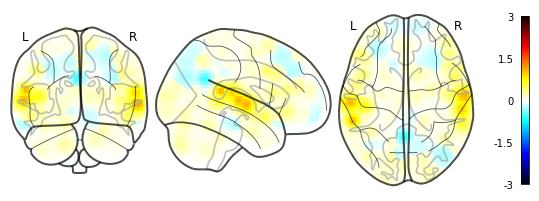

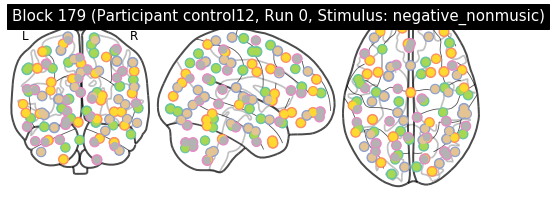

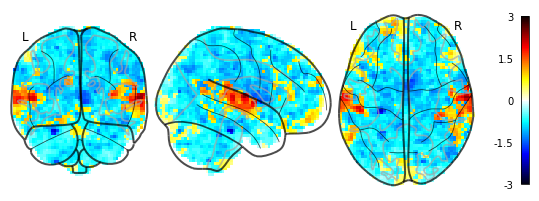

01/31/2020 18:23:26 Reconstruction Error (Frobenius Norm): 8.20994873e+02 out of 8.18766968e+02


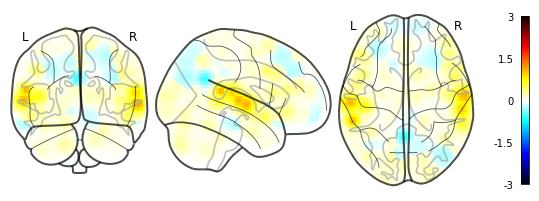

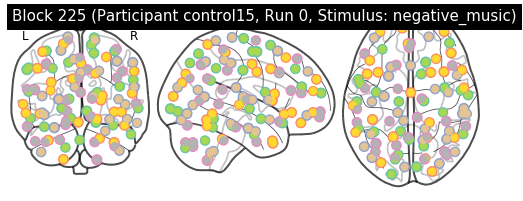

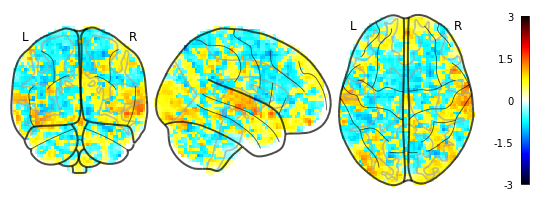

01/31/2020 18:23:30 Reconstruction Error (Frobenius Norm): 9.04440735e+02 out of 9.03035767e+02


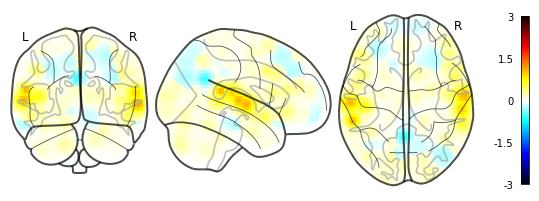

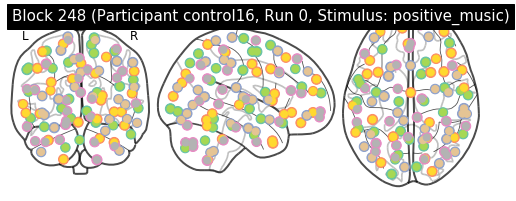

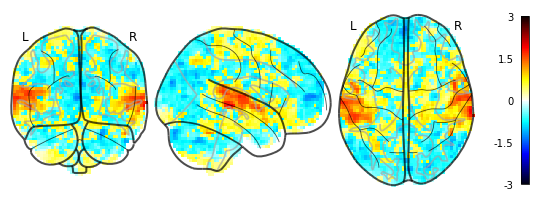

01/31/2020 18:23:33 Reconstruction Error (Frobenius Norm): 8.49485046e+02 out of 8.52762634e+02


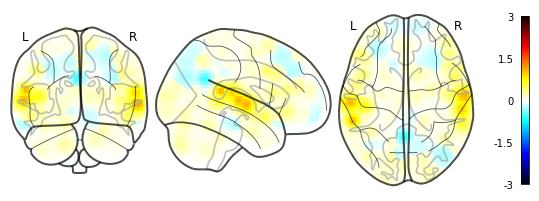

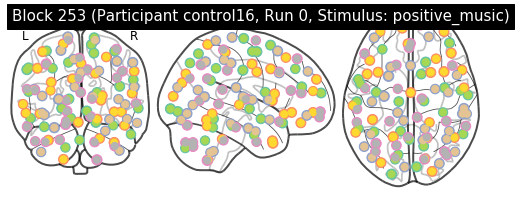

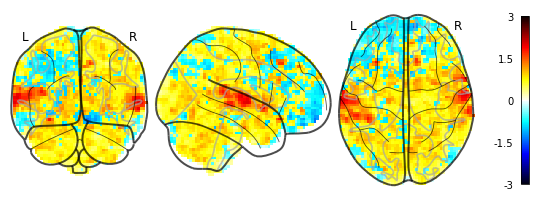

01/31/2020 18:23:37 Reconstruction Error (Frobenius Norm): 8.36426941e+02 out of 8.46491333e+02


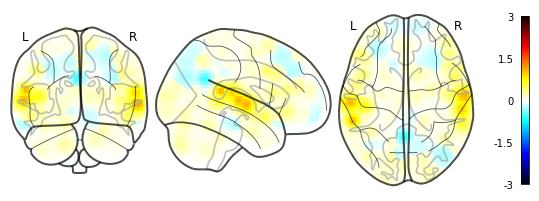

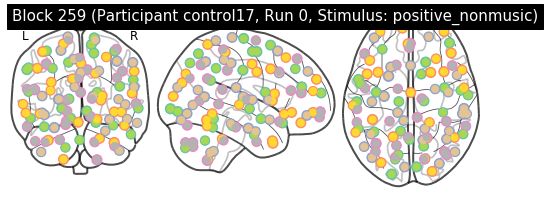

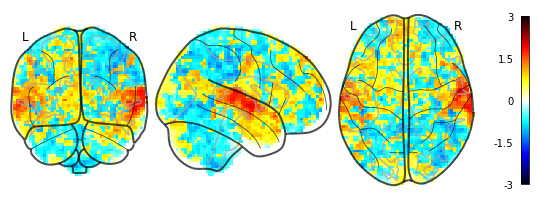

01/31/2020 18:23:41 Reconstruction Error (Frobenius Norm): 9.39909546e+02 out of 9.42982117e+02


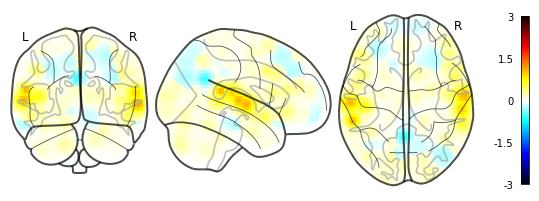

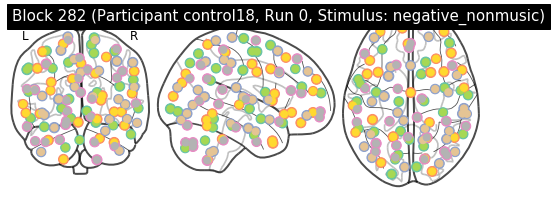

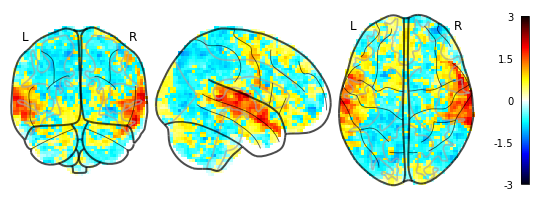

01/31/2020 18:23:44 Reconstruction Error (Frobenius Norm): 9.01093994e+02 out of 9.06209839e+02


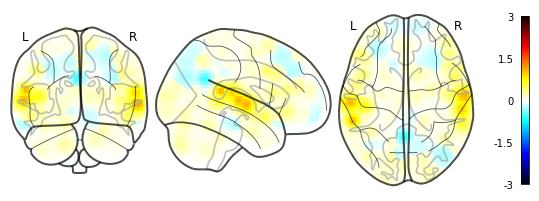

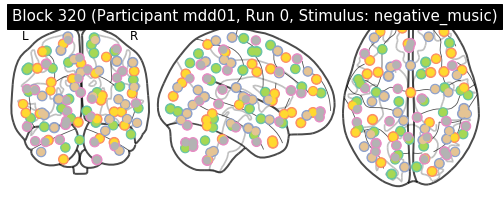

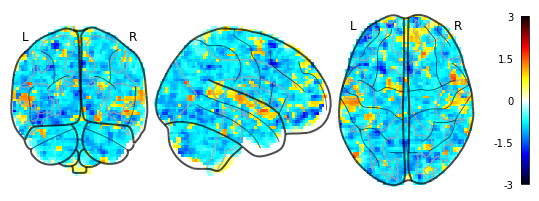

01/31/2020 18:23:48 Reconstruction Error (Frobenius Norm): 8.88110901e+02 out of 8.79910095e+02


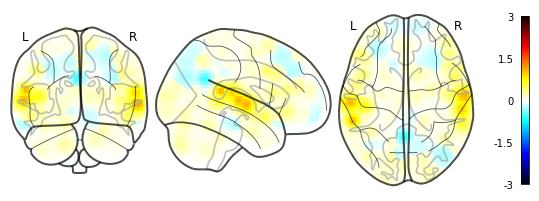

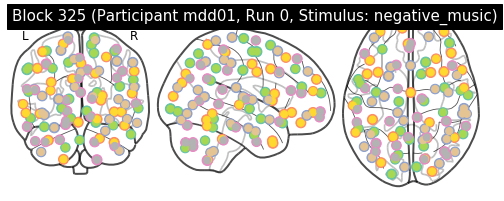

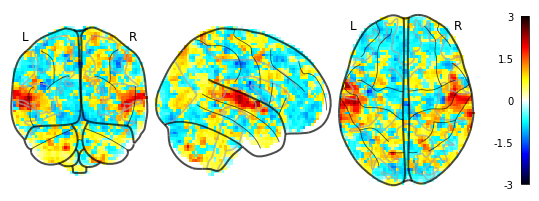

01/31/2020 18:23:52 Reconstruction Error (Frobenius Norm): 8.92470886e+02 out of 8.95499817e+02


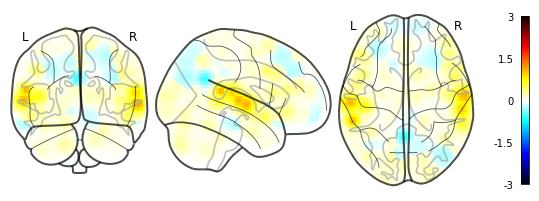

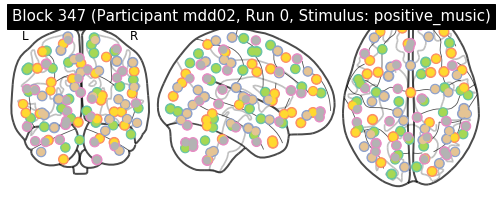

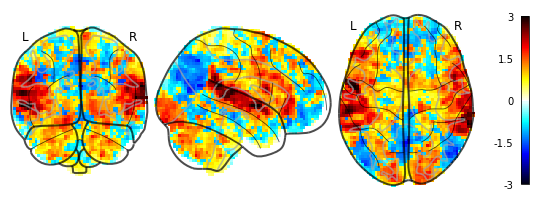

01/31/2020 18:23:56 Reconstruction Error (Frobenius Norm): 9.50725952e+02 out of 9.67287537e+02


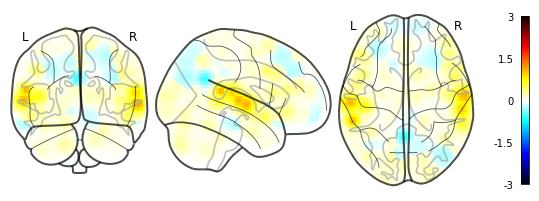

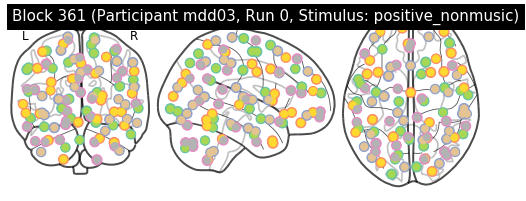

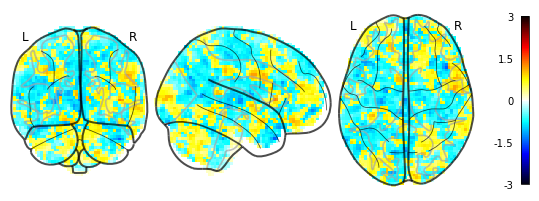

01/31/2020 18:24:00 Reconstruction Error (Frobenius Norm): 8.86592346e+02 out of 8.82675720e+02


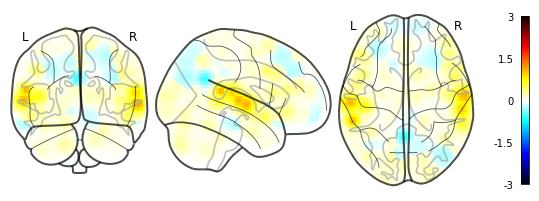

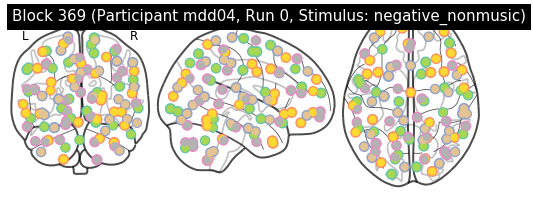

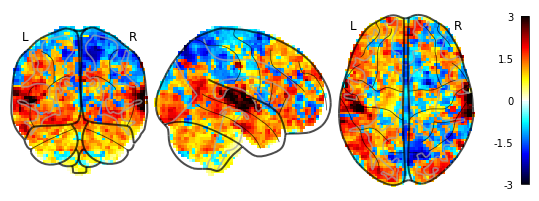

01/31/2020 18:24:03 Reconstruction Error (Frobenius Norm): 1.00745428e+03 out of 1.01888086e+03


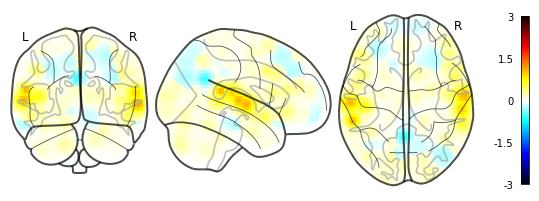

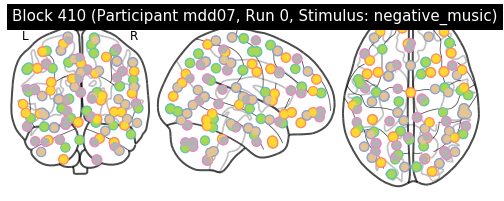

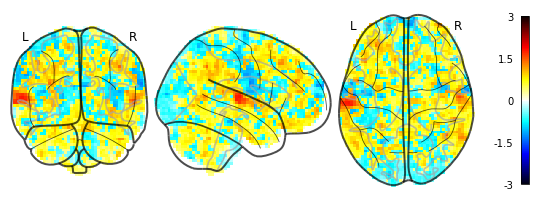

01/31/2020 18:24:07 Reconstruction Error (Frobenius Norm): 8.45650513e+02 out of 8.46869873e+02


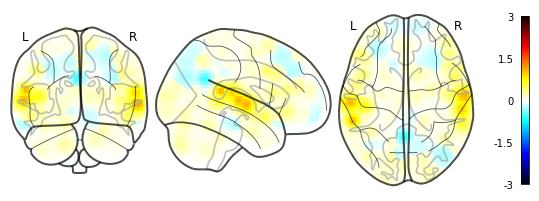

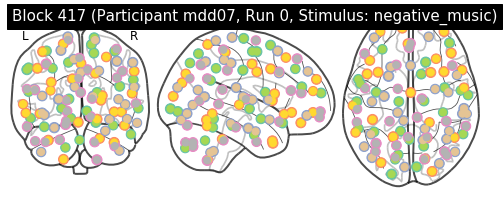

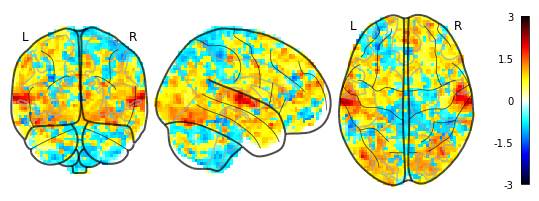

01/31/2020 18:24:11 Reconstruction Error (Frobenius Norm): 8.39386475e+02 out of 8.45543823e+02


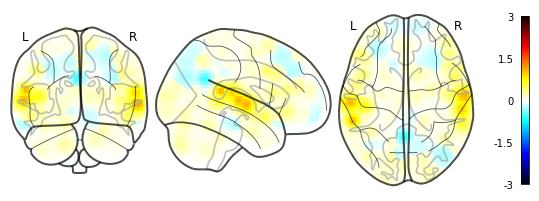

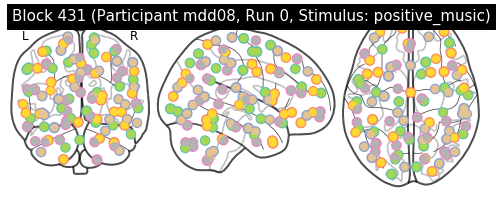

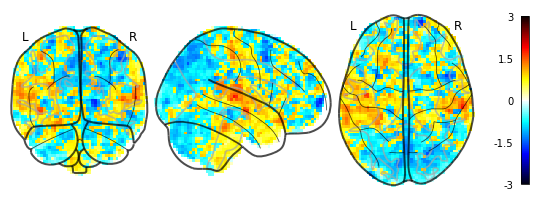

01/31/2020 18:24:15 Reconstruction Error (Frobenius Norm): 8.97226868e+02 out of 8.99290405e+02


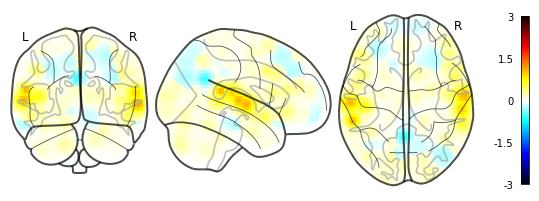

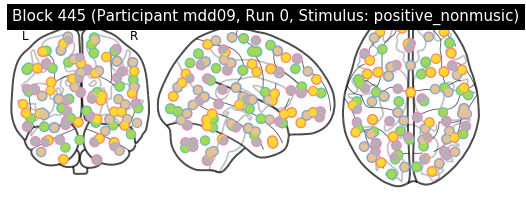

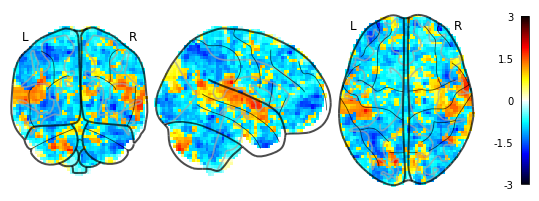

01/31/2020 18:24:19 Reconstruction Error (Frobenius Norm): 9.57240051e+02 out of 9.54931152e+02


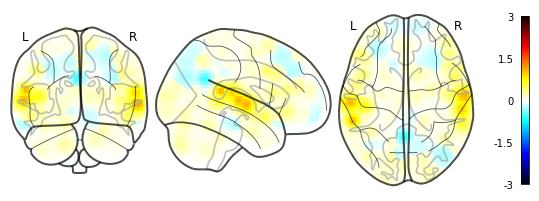

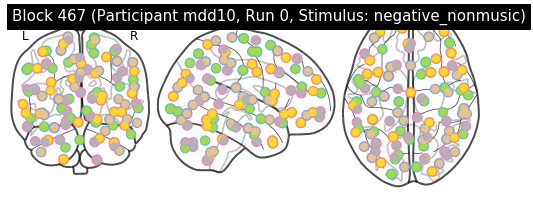

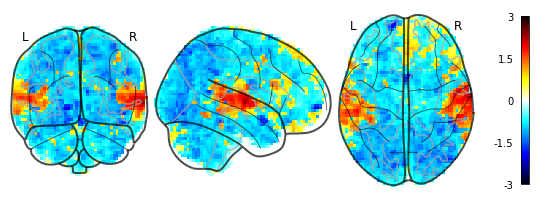

01/31/2020 18:24:22 Reconstruction Error (Frobenius Norm): 8.50073303e+02 out of 8.51223450e+02


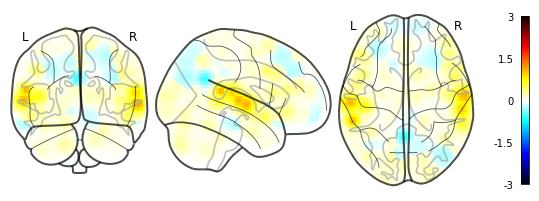

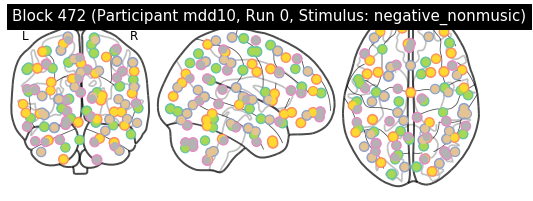

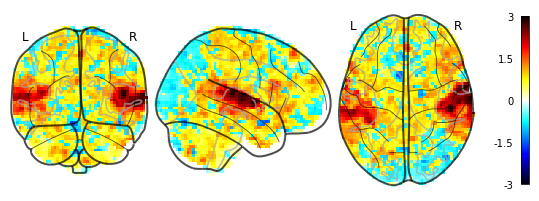

01/31/2020 18:24:26 Reconstruction Error (Frobenius Norm): 8.71122314e+02 out of 8.85499268e+02


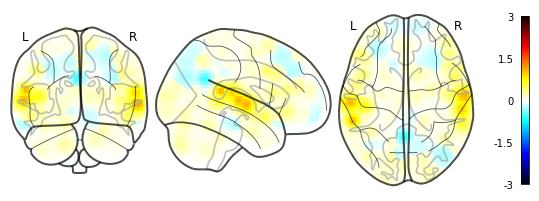

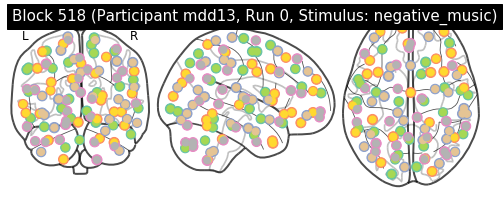

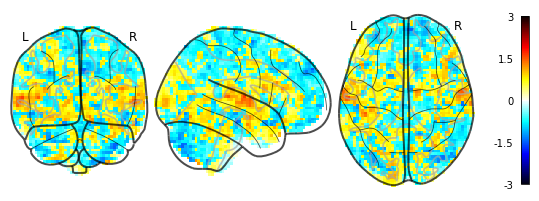

01/31/2020 18:24:30 Reconstruction Error (Frobenius Norm): 8.83046509e+02 out of 8.83407654e+02


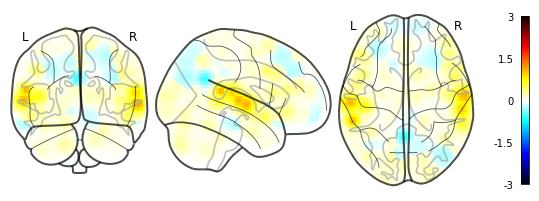

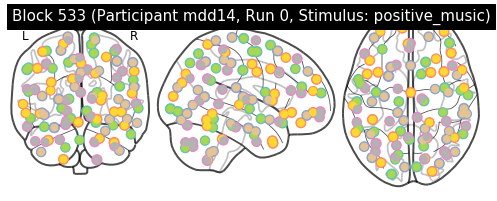

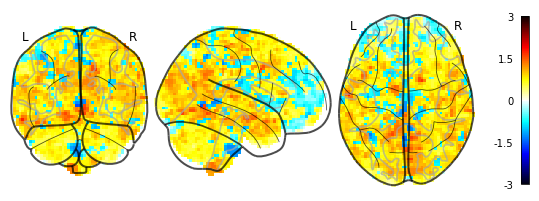

01/31/2020 18:24:34 Reconstruction Error (Frobenius Norm): 9.04924194e+02 out of 9.08449036e+02


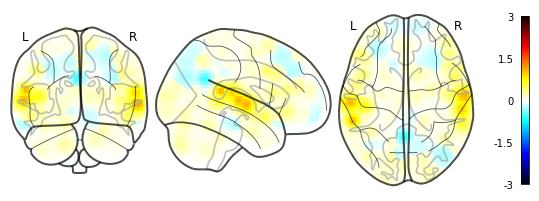

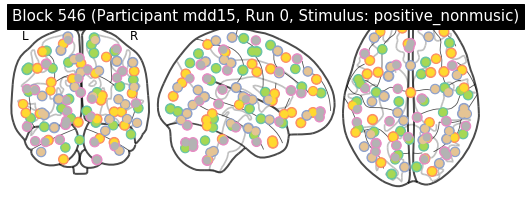

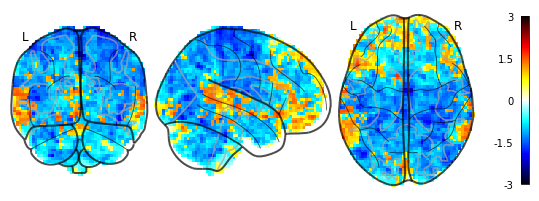

01/31/2020 18:24:38 Reconstruction Error (Frobenius Norm): 9.41564575e+02 out of 9.35163940e+02


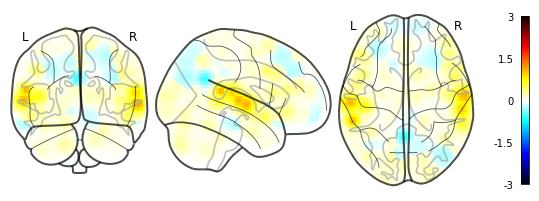

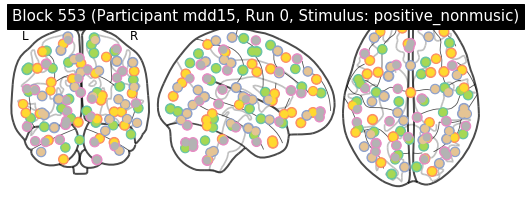

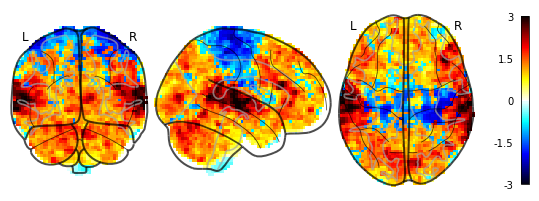

01/31/2020 18:24:41 Reconstruction Error (Frobenius Norm): 9.97794739e+02 out of 1.01635852e+03


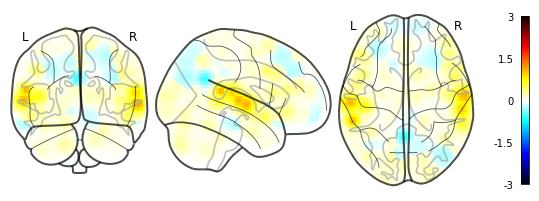

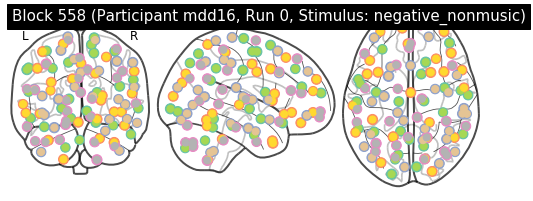

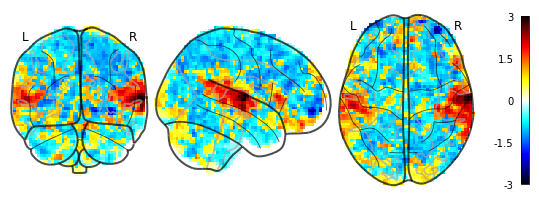

01/31/2020 18:24:45 Reconstruction Error (Frobenius Norm): 8.78193176e+02 out of 8.84148621e+02


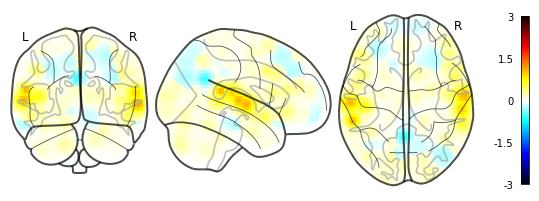

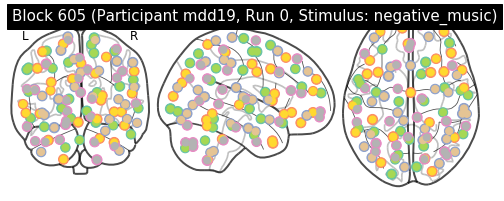

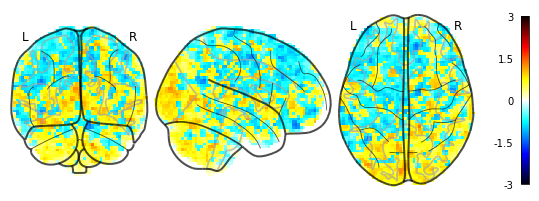

01/31/2020 18:24:49 Reconstruction Error (Frobenius Norm): 9.37473389e+02 out of 9.34860962e+02


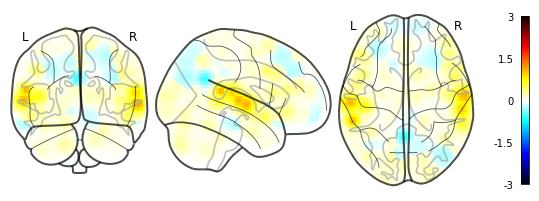

In [13]:
for index in validation_blocks[0:-1:3]:
    htfa.plot_factor_centers(index)
    htfa.plot_original_brain(index, labeler=lambda b: None, t=None)
    htfa.plot_reconstruction(index, labeler=lambda b: None, t=None, blocks_filter=lepping_db.inference_filter(training=True))

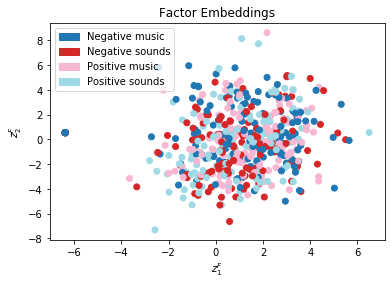

In [14]:
#factor 'embeddings' with PCA
htfa.scatter_factor_embedding(labeler=task_labeler, embedding='PCA')

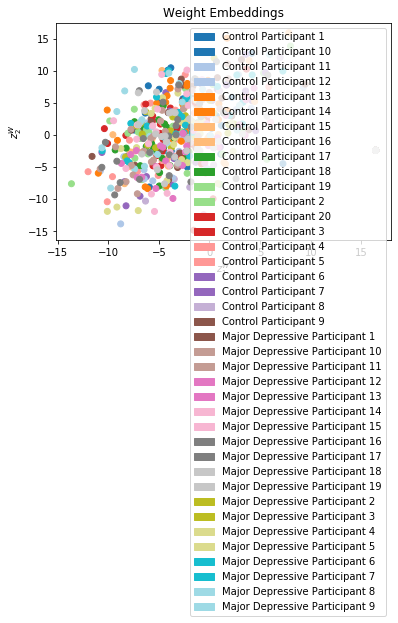

In [15]:
#weight 'embeddings' with PCA
htfa.scatter_weight_embedding(labeler=subject_labeler, embedding='PCA')

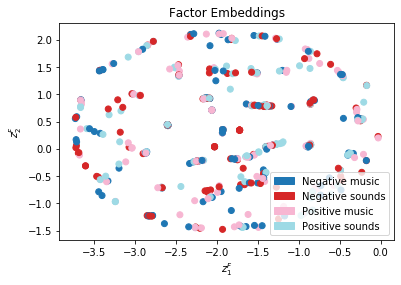

In [16]:
#factor 'embeddings' with TSNE
htfa.scatter_factor_embedding(labeler=task_labeler, embedding='TSNE')

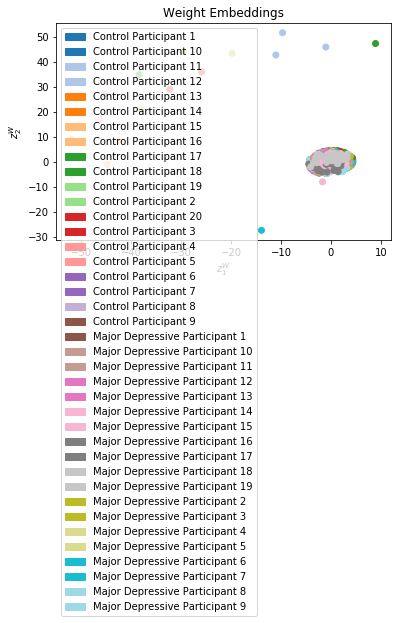

In [17]:
#weight 'embeddings' with TSNE
htfa.scatter_weight_embedding(labeler=subject_labeler, embedding='TSNE')

In [18]:
htfa.average_reconstruction_error(weighted=False, blocks_filter=lepping_db.inference_filter(training=True))

01/31/2020 18:25:32 Average reconstruction error (MSE): 7.89885805e+02 +/- 4.64823369e+01
01/31/2020 18:25:32 Average data norm (Euclidean): 9.08544117e+02 +/- 5.34724127e+01
01/31/2020 18:25:32 Percent average reconstruction error: 87.052289 +/- 4.44211641e+00


(array([818.27923584, 796.28533936, 736.26879883, 817.55609131,
        763.78283691, 779.46594238, 818.45904541, 793.378479  ,
        718.91693115, 717.45141602, 736.1875    , 727.371521  ,
        761.46948242, 807.84295654, 781.6473999 , 766.81359863,
        746.57818604, 776.50549316, 758.73132324, 772.78094482,
        816.38189697, 833.95159912, 842.13702393, 831.86883545,
        794.48034668, 812.96087646, 807.23687744, 791.05010986,
        774.15325928, 845.86431885, 791.41485596, 826.02734375,
        762.31201172, 777.53625488, 770.72131348, 763.4932251 ,
        734.29223633, 732.55194092, 727.54632568, 697.58935547,
        806.51672363, 798.73577881, 803.92169189, 820.00756836,
        815.17175293, 810.4251709 , 819.54840088, 797.07623291,
        821.38635254, 839.18615723, 840.88146973, 855.2824707 ,
        840.11834717, 837.54315186, 830.29626465, 815.5489502 ,
        882.52923584, 875.97930908, 849.36383057, 807.56414795,
        824.13208008, 830.56390381, 785.

In [19]:
def condition_labeler(block):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(block.subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        return 'Major Depressive'
    elif condition == 'control':
        return 'Control'
    return condition

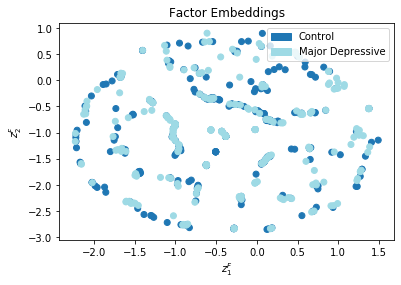

In [20]:
htfa.scatter_factor_embedding(labeler=condition_labeler, embedding='TSNE')

In [21]:
htfa.free_energy(batch_size=50, use_cuda=True, blocks_batch_size=12, sample_size=100,
                 blocks_filter=lepping_db.inference_filter(training=True))

[[551378944.0, -541726784.0, 9652177.0],
 [551464192.0, -541639808.0, 9654357.0]]

In [22]:
htfa.free_energy(batch_size=50, use_cuda=True, blocks_batch_size=12, sample_size=100,
                 blocks_filter=lepping_db.inference_filter(training=False))

[[173954912.0, -172436640.0, 1518269.125],
 [183779008.0, -168074928.0, 1519427.5]]